# Text classification

## Setup

Below we are importing required libraries. We will be using [scikit-learn](https://scikit-learn.org) for text classification. We will use the Naive Bayes Classifier. Scikit-learn has different feature extraction methods based on counts or tf-idf weights. We will also use NLTK for pre-processing.

In [3]:
from sklearn.datasets import load_files
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.datasets import fetch_20newsgroups

import numpy

import matplotlib.pyplot as plt
from wordcloud import WordCloud

import re

import nltk
from nltk import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer 
from nltk.stem import SnowballStemmer 
from nltk.stem import PorterStemmer 
from nltk.corpus import wordnet

Making sure we have the NLTK stopwords and the NLTK POS tagger (used by the NLTK lemmatiser).

In [4]:
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

This cell loads some defaults for the stop word lists.

In [5]:
stop_words = None
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as sklearn_stop_words
nltk_stop_words = nltk.corpus.stopwords.words('english')

Define some functions ...

In [6]:
# nice preview of document
def get_preview(docs, targets, target_names, doc_id, max_len=0):
    preview = ''
    if max_len < 1:
        preview += 'Label\n'
        preview += '=====\n'
    else:
        preview += str(doc_id)
        preview += '\t'
    preview += target_names[targets[doc_id]]
    if max_len < 1:
        preview += '\n\nFull Text\n'
        preview += '=========\n'
        preview += docs[doc_id]
        preview += '\n'
    else:
        excerpt = get_excerpt(docs[doc_id], max_len)
        preview += '\t' + excerpt
    return preview

_RE_COMBINE_WHITESPACE = re.compile(r"\s+")

# generate an excerpt
def get_excerpt(text, max_len):
    excerpt = _RE_COMBINE_WHITESPACE.sub(' ',text[0:max_len])
    if max_len < len(text):
        excerpt += '...'
    return excerpt.strip()

# combine a defined stop word list (or no stop word list) with any extra stop words defined
def set_stop_words(stop_word_list, extra_stop_words):
    if len(extra_stop_words) > 0:
        if stop_word_list is None:
            stop_word_list = []
        stop_words = list(stop_word_list) + extra_stop_words
    else:
        stop_words = stop_word_list
        
    return stop_words

# initiate stemming or lemmatising
def set_normaliser(normalise):
    if normalise == 'PorterStemmer':
        normaliser = PorterStemmer()
    elif normalise == 'SnowballStemmer':
        normaliser = SnowballStemmer('english')
    elif normalise == 'WordNetLemmatizer':
        normaliser = WordNetLemmatizer()
    else:
        normaliser = None
    return normaliser

# we are using a custom tokenisation process to allow different tokenisers and stemming/lemmatising ...
def tokenise(doc):
    global tokeniser, normalise, normaliser
    
    
    if tokeniser == 'sklearn':
        tokenizer = RegexpTokenizer(r"(?u)\b\w\w+\b") # this is copied straight from sklearn source
        tokens = tokenizer.tokenize(doc)
    elif tokeniser == 'word_tokenize':
        tokens = word_tokenize(doc)
    elif tokeniser == 'wordpunct':
        tokens = wordpunct_tokenize(doc)
    else:
        tokens = word_tokenize(doc)
        
    # if using a normaliser then iterate through tokens and return the normalised tokens ...
    if normalise == 'PorterStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'SnowballStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'WordNetLemmatizer':
        # NLTK's lemmatiser needs parts of speech, otherwise assumes everything is a noun
        pos_tokens = nltk.pos_tag(tokens)
        lemmatised_tokens = []
        for token in pos_tokens:
            # NLTK's lemmatiser needs specific values for pos tags - this rewrites them ...
            # default to noun
            tag = wordnet.NOUN
            if token[1].startswith('J'):
                tag = wordnet.ADJ
            elif token[1].startswith('V'):
                tag = wordnet.VERB
            elif token[1].startswith('R'):
                tag = wordnet.ADV
            lemmatised_tokens.append(normaliser.lemmatize(token[0],tag))
        return lemmatised_tokens
    else:
        # no normaliser so just return tokens
        return tokens

## Preview stop word lists

Pre-processing can have a major influence on the results of text classification tasks. In particular, we should put thought into whether a stop word list is sensible for our task. The scikit-learn website also makes this point at https://scikit-learn.org/stable/modules/feature_extraction.html#stop-words and recommends caution about using its stop word list! 

Using the cells below we can preview the stop word lists supplied by scikit-learn and NLTK. We notice they are quite different.

In [7]:
print(sklearn_stop_words)

frozenset({'was', 'eg', 'were', 'onto', 'amoungst', 'my', 'to', 'her', 'both', 'then', 'made', 'nine', 'eight', 'somewhere', 'beforehand', 'because', 'thereby', 'before', 'full', 'hundred', 'around', 'as', 'whether', 'us', 'done', 'four', 'its', 'alone', 'first', 'becoming', 'for', 'namely', 'co', 'has', 'off', 'keep', 'take', 'twenty', 'see', 'eleven', 'again', 'sometime', 'than', 'neither', 'well', 'hasnt', 'are', 'an', 'less', 'moreover', 'con', 'former', 'empty', 'amongst', 'not', 'they', 'is', 'more', 'whence', 'serious', 'after', 'third', 'therein', 'within', 'yourselves', 'un', 'own', 'the', 'myself', 'almost', 'can', 'six', 'others', 'across', 'latter', 'only', 'therefore', 'further', 'a', 'every', 'them', 'call', 'due', 'ourselves', 'why', 'nowhere', 'via', 'whereupon', 'by', 'too', 'five', 'several', 'although', 'how', 'nothing', 'herself', 'once', 'hereafter', 'twelve', 'interest', 'everyone', 'never', 'herein', 'me', 'either', 'fill', 'she', 'go', 'each', 'upon', 'hers', 'a

In [8]:
print(nltk_stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

## Load corpus and set train/test split

Scikit-learn is packaged with a number of standard data-sets used in machine learning and provides a way to load other data.   We will begin by loading texts from two categories in the [20 newsgroups dataset](http://qwone.com/~jason/20Newsgroups/) to work through an example classifying documents related to politics and religion.

What is a newsgroup? We are stretching back into internet history here - way before people talked to strangers on Facebook and Twitter and other social media, there were Usenet Newsgroups! [Here is a link to a Deja News page from 1998](https://web.archive.org/web/19980127204536/http://emarket.dejanews.com/emarket/about/idgs/aboutidgs.shtml) and also a [Wikipedia article](https://en.wikipedia.org/wiki/Usenet_newsgroup) that explains what Newsgroups are all about. 

Here is more information on the scikit-learn functionality to load this corpora, as well as a list of all the categories represented: https://scikit-learn.org/stable/datasets/index.html#the-20-newsgroups-text-dataset

This cell also sets the train/test split. 80% of the data is used for training and 20% is used for testing. The documents are assigned to each group randomly. It can be useful to rerun this cell to reshuffle our dataset so we can evaluate our model using different data for training and testing.

In [9]:
# this chooses the categories to load
cats = ['talk.politics.misc', 'talk.religion.misc']

# this downloads/loads the data
dataset = fetch_20newsgroups(subset='train', categories=cats)
#dataset = fetch_20newsgroups(subset='train', remove=('headers', 'footers', 'quotes'), categories=cats)

# assign the train/test split - 0.2 is 80% for training, 20% for testing
test_size = 0.2

# do the train test split ...
# docs_train and docs_test are the documents
# y_train and y_test are the labels
docs_train, docs_test, y_train, y_test = train_test_split(dataset.data, dataset.target, 
                                                          test_size = test_size, random_state=None)

## Inspect documents and labels

In the next cells we can look at the data we have imported. Firstly, we will preview the document labels and a brief excerpt.

In [10]:
for train_id in range(len(docs_train)):
    print(get_preview(docs_train, y_train, dataset.target_names, train_id, max_len=80))

0	talk.politics.misc	From: dreitman@oregon.uoregon.edu (Daniel R. Reitman, Attorney to Be) Subject: R...
1	talk.politics.misc	From: rscharfy@magnus.acs.ohio-state.edu (Ryan C Scharfy) Subject: Re: Good Neig...
2	talk.politics.misc	From: cutter@gloster.via.mind.org (cutter) Subject: Re: NC vs Hunt (Marine Gay B...
3	talk.religion.misc	From: pharvey@quack.kfu.com (Paul Harvey) Subject: Re: Who's next? Mormons and ...
4	talk.politics.misc	From: muellerm@vuse.vanderbilt.edu (Marc Mueller) Subject: Re: Pork ( C-17 & C-5...
5	talk.politics.misc	From: andersom@spot.Colorado.EDU (Marc Anderson) Subject: response Nntp-Posting-...
6	talk.politics.misc	From: elf@halcyon.com (Elf Sternberg) Subject: Re: New Study Out On Gay Percenta...
7	talk.religion.misc	From: livesey@solntze.wpd.sgi.com (Jon Livesey) Subject: Re: After 2000 years, c...
8	talk.religion.misc	From: smithw@col.hp.com (Walter Smith) Subject: Re: Part 1 and part 2 (re: Homo...
9	talk.religion.misc	From: psyrobtw@ubvmsb.cc.buffalo.edu

We can use this cell to inspect a specific document and its label based on its index in the training set. Note: The indexes will change each time we import the data above because of the random train/test split.

In [11]:
train_id = 11
print(get_preview(docs_train, y_train, dataset.target_names, train_id))

Label
=====
talk.politics.misc

Full Text
From: mike@gordian.com (Michael A. Thomas)
Subject: Re: The Role of the National News Media in Inflaming Passions
Organization: Gordian; Costa Mesa, CA
Distribution: ca
Lines: 13

In article <1qjtmjINNq45@elroy.jpl.nasa.gov>, carlos@beowulf.Jpl.Nasa.Gov (Carlos Carrion) writes:
> 	I have come to the conclusion that the TV stations here in LA
> 	WANT a riot to happen when the verdict comes in.

   Why is this surprising? Then the _Times_ can get a few more
Pulitzers the same way they did last year.
-- 

		Michael Thomas	(mike@gordian.com)
	"I don't think Bambi Eyes will get you that flame thrower..."  
		-- Hobbes to Calvin
		USnail: 20361 Irvine Ave Santa Ana Heights, Ca,	92707-5637
		PaBell: (714) 850-0205 (714) 850-0533 (fax)




## Preprocessing

This next section of the notebook includes some key kinds of pre-processing for text classification using Naive Bayes and a bag of words model.

### Choose between token counts or tf-idf weights

We can choose between frequency for our bag of words or tf-idf weights. Valid values are:
```
Vectorizer = CountVectorizer
```
or
```
Vectorizer = TfidfVectorizer
```

In [13]:
Vectorizer = CountVectorizer

### Lowercase

Setting lowercase to True will transform all document text to lowercase. Setting it to False will not do this transformation.

In [14]:
lowercase = True

### Set how we are tokenising the text

With this notebook we can choose between the following tokenisers.

This option duplicates the behaviour of scikit-learn's default tokeniser: "The default regexp select tokens of 2 or more alphanumeric characters (punctuation is completely ignored and always treated as a token separator)". In this notebook we duplicate this behaviour using the NLTK's regular expression tokeniser and this regular expression: `r"(?u)\b\w\w+\b"`.
```
tokeniser = 'sklearn'
```
We can use this or specify one of the following tokenisers based on NLTK ...

Tokenise based on NLTK's wordpunct_tokenize tokeniser (to include words and punctuation!):
```
tokeniser = 'wordpunct'
```
This applies NLTK's word_tokenize tokeniser.
```
tokeniser = 'word_tokenize'
```

In [15]:
tokeniser = 'sklearn'

### Stemming / Lemmatising

This allows to use NLTK stemmers or lemmatisers (or not). Valid options are shown below. More information on the NLTK website: https://www.nltk.org/api/nltk.stem.html. Note: that stemming and lemmatising (in particular) will make the preprocessing take longer!

```
normalise = None
```
or
```
normalise = 'PorterStemmer'
```
or
```
normalise = 'SnowballStemmer'
```
or
```
normalise = 'WordNetLemmatizer'
```

In [16]:
normalise = None

### Configure stop words

Valid values for stop_words below are:
```
stop_word_list = None
```
or
```
stop_word_list = nltk_stop_words
```
or
```
stop_word_list = sklearn_stop_words
```

In [17]:
stop_word_list = None

We can also add extra stop words to any of the lists above.
For example:
```
extra_stop_words = ['stopword1','stopword2','stopword3']
```
If we don't want extra stop words, then the next cell should look like:
```
extra_stop_words = []
```

In [18]:
extra_stop_words = []

### Filter features based on document frequency

The following values allow us to remove features that occur in many documents or in only a few documents.

Firstly, `min_df` ignores terms that occur below a minimum proportion of documents. For example, 0.01 would ignore terms that occur in less than 1% of documents.

In [23]:
min_df = 0.0

`max_df` allows us to ignore terms above a maximum proportion of documents. For example, 0.95 would ignore terms that occur in more than 95% of documents.

In [24]:
max_df = 1.0

### Set a maximum number of features

`max_features` set this to `None` for no limit or set to the maximum number of the most frequent features (e.g setting it to 1000 would use the 1000 most frequent features).

In [19]:
max_features = 1000

### Ngrams

With ngram_range set to (1,1) we will use unigrams as features i.e. each feature will be a token. If we set it to (1,2) we will use unigrams and bigrams. (1,3) will use unigrams, bigrams and trigrams. If we just want bigrams we would use (2,2). Increasing the ngram range from (1,1) will add more time to preprocessing, as there will be more features.

In [20]:
ngram_range = (1,1)

### Encoding options

We can change the default encoding here and what to do if we get characters outside our default encoding.

In [21]:
encoding = 'utf-8'
decode_error = 'ignore' # what to do if contains characters not of the given encoding - options 'strict', 'ignore', 'replace'

## Setup the feature extraction and classification pipeline

This sets up a sci-kit learn pipeline that does feature extraction and classification. 

**Important Note** When we change settings above or reload our dataset we should rerun this cell!

In [25]:
stop_words = set_stop_words(stop_word_list, extra_stop_words)
normaliser = set_normaliser(normalise)

pipeline = Pipeline([
    ('vectorizer', Vectorizer(
            tokenizer = tokenise,
            lowercase = lowercase,
            min_df = min_df, 
            max_df = max_df, 
            max_features = max_features,
            stop_words = stop_words, 
            ngram_range = ngram_range,
            encoding = encoding, 
            decode_error = decode_error)),
    ('classifier', MultinomialNB()), #here is where we would specify an alternative classifier
])

print('Classifier settings')
print('===================')
print('classifier:', type(pipeline.steps[1][1]).__name__)
print('vectorizer:', type(pipeline.steps[0][1]).__name__)
print('classes:', dataset.target_names)
print('lowercase:', lowercase)
print('tokeniser:', tokeniser)
print('normalise:', normalise)
print('min_df:', min_df)
print('max_df:', max_df)
print('max_features:', max_features)
if stop_word_list == nltk_stop_words:
    print('stop_word_list:', 'nltk_stop_words')
elif stop_word_list == sklearn_stop_words:
    print('stop_word_list:', 'sklearn_stop_words')
else:
    print('stop_word_list:', 'None')
print('extra_stop_words:', extra_stop_words)
print('ngram_range:', ngram_range)
print('encoding:', encoding)
print('decode_error:', decode_error)

Classifier settings
classifier: MultinomialNB
vectorizer: CountVectorizer
classes: ['talk.politics.misc', 'talk.religion.misc']
lowercase: True
tokeniser: sklearn
normalise: None
min_df: 0.0
max_df: 1.0
max_features: 1000
stop_word_list: None
extra_stop_words: []
ngram_range: (1, 1)
encoding: utf-8
decode_error: ignore


## Train the classifier and predict labels on test data

This cell does the work of training the classifier and predicting labels on test data. It also outputs evaluation metrics, a confusion matrix and features indicative of each class.

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Evaluation metrics
                    precision    recall  f1-score   support

talk.politics.misc       0.95      0.92      0.93        96
talk.religion.misc       0.89      0.93      0.91        73

          accuracy                           0.92       169
         macro avg       0.92      0.92      0.92       169
      weighted avg       0.92      0.92      0.92       169



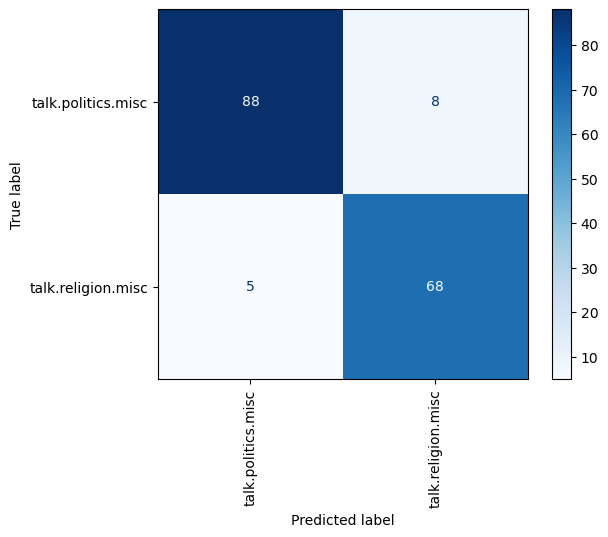


Features most indicative of talk.politics.misc
stephanopoulos cramer optilink myers isc package kaldis thor rutgers drugs summer billion nuclear steveh senate clayton gov ted mit republicans 

Features most indicative of talk.religion.misc
jesus judas christians christ christian lds weiss tyre lee royalroads magi decenso commandments kendig beast halat testament kent sandvik biblical 

In [27]:
pipeline.fit(docs_train, y_train)
y_predicted = pipeline.predict(docs_test)

# print report
print('Evaluation metrics')
print('==================')
print(metrics.classification_report(y_test, y_predicted, target_names = dataset.target_names))
cm = metrics.confusion_matrix(y_true=y_test, y_pred=y_predicted, labels=[0, 1])

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dataset.target_names)
disp = disp.plot(include_values=True, cmap='Blues', ax=None, xticks_rotation='vertical')
plt.show()

vect = pipeline.steps[0][1]
clf = pipeline.steps[1][1]

print()

logodds=clf.feature_log_prob_[1]-clf.feature_log_prob_[0]

print("Features most indicative of",dataset.target_names[0])
print('============================' + '='*len(dataset.target_names[0]))
for i in numpy.argsort(logodds)[:20]:
    print(vect.get_feature_names_out()[i], end=' ')
print()
print()

print("Features most indicative of",dataset.target_names[1])
print('============================' + '='*len(dataset.target_names[1]))
for i in numpy.argsort(-logodds)[:20]:
    print(vect.get_feature_names_out()[i], end=' ')
    
lookup = dict((v,k) for k,v in vect.vocabulary_.items())

## List all features

Just for our reference here is a count and list of all features used in this model.

In [28]:
print('Total Features: ',len(vect.get_feature_names_out()))
print(vect.get_feature_names_out())

Total Features:  1000
['000' '10' '100' '11' '12' '13' '14' '15' '16' '17' '18' '19' '1993'
 '1993apr15' '20' '2000' '21' '22' '23' '25' '26' '27' '30' '40' '41' '93'
 'able' 'abortion' 'about' 'above' 'accept' 'access' 'according' 'acs'
 'act' 'action' 'actions' 'activities' 'acts' 'actually' 'address'
 'administration' 'after' 'again' 'against' 'age' 'ago' 'agree' 'aid' 'al'
 'all' 'allowed' 'almost' 'alone' 'along' 'already' 'also' 'alt'
 'although' 'always' 'am' 'america' 'american' 'americans' 'among'
 'amount' 'an' 'and' 'angeles' 'another' 'answer' 'anti' 'any' 'anyone'
 'anything' 'anyway' 'apparently' 'apple' 'apply' 'approach' 'apr' 'april'
 'are' 'area' 'areas' 'aren' 'argument' 'arguments' 'around' 'article'
 'articles' 'as' 'ask' 'asked' 'assume' 'at' 'atlantaga' 'attack'
 'authority' 'available' 'aware' 'away' 'back' 'bad' 'base' 'based'
 'basic' 'basis' 'be' 'beast' 'because' 'become' 'been' 'before' 'being'
 'belief' 'beliefs' 'believe' 'best' 'better' 'between' 'bible'

## Inspect correctly/incorrectly classified documents

The output in the next cell is quite long and will take a few moments to generate. It will show us wordclouds and a preview of documents for correctly and incorrectly classified documents. The size of words in the wordclouds are based on adding up counts/tf-idf scores of features based on documents related to each cell in the confusion matrix 

talk.politics.misc Correctly classified


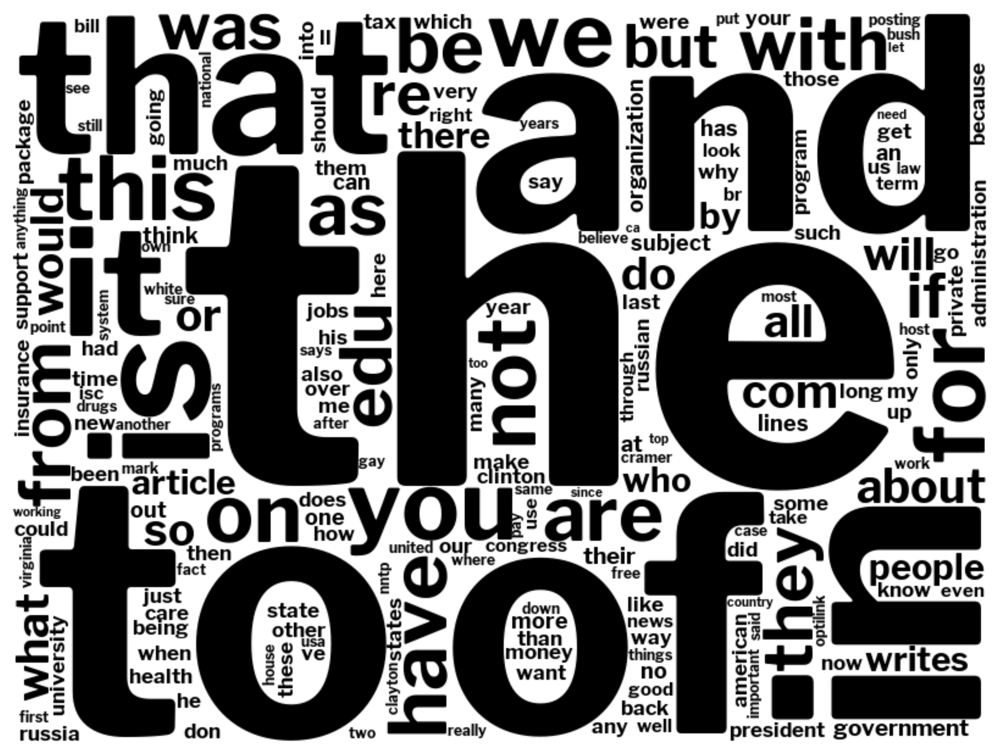

4	talk.politics.misc	From: matt@galaxy.nsc.com (Matt Freivald x8043) Subject: Re: NLNS: Fascism with ...
5	talk.politics.misc	From: steveh@thor.isc-br.com (Steve Hendricks) Subject: Re: Limiting Govt (was R...
8	talk.politics.misc	From: dreitman@oregon.uoregon.edu (Daniel R. Reitman, Attorney to Be) Subject: R...
9	talk.politics.misc	From: richw@mks.com (Rich Wales) Subject: Sick and tired (was Re: Bill Conklin (...
10	talk.politics.misc	From: carlos@beowulf.Jpl.Nasa.Gov (Carlos Carrion) Subject: Re: The Role of the ...
12	talk.politics.misc	From: gld@cunixb.cc.columbia.edu (Gary L Dare) Subject: Re: EIGHT MYTHS about Na...
16	talk.politics.misc	Organization: Students for Increased Beverage Access (SIBA) From: Mark 'Mark' Sa...
17	talk.politics.misc	From: gsh7w@fermi.clas.Virginia.EDU (Greg Hennessy) Subject: Re: Why not concent...
18	talk.politics.misc	From: Clinton-HQ@Campaign92.Org (Clinton/Gore '92) Subject: CLINTON: Background ...
19	talk.politics.misc	From: hallam@dscomsa.desy.de

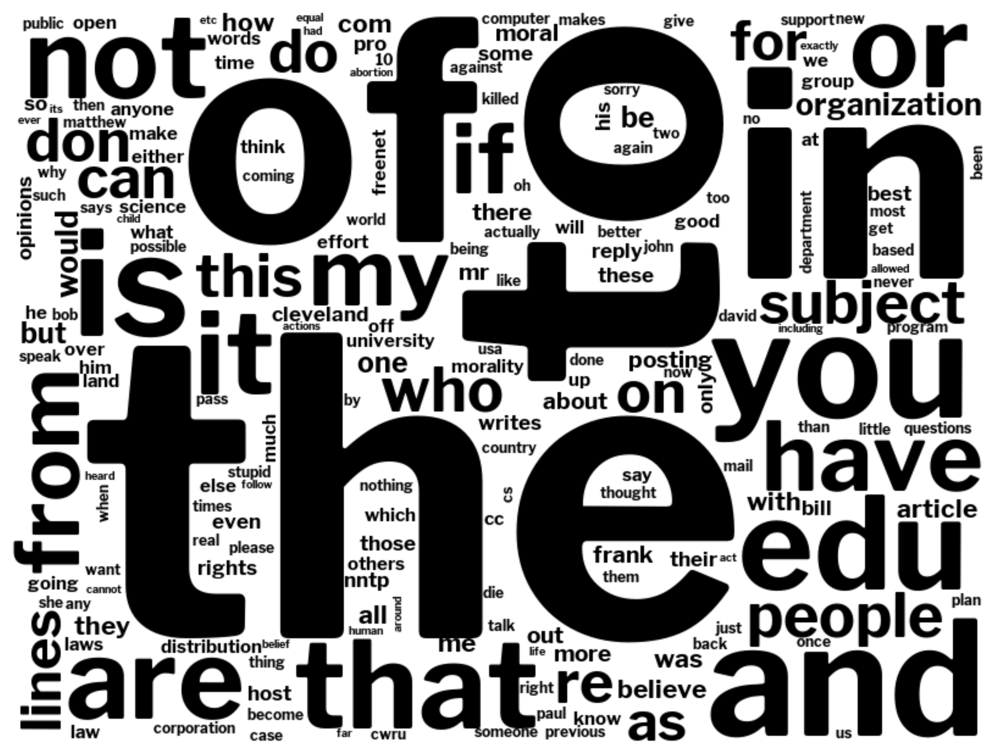

1	talk.politics.misc	From: bob1@cos.com (Bob Blackshaw) Subject: Re: I thought commercial Advertising...
11	talk.politics.misc	From: stromer@eyore.unet.com (Philip H. Stromer) Subject: Re: URGENT **** TED FR...
28	talk.politics.misc	From: riggs@descartes.etl.army.mil (Bill Riggs) Subject: Re: hard times investme...
34	talk.politics.misc	From: schwarze@starbase1.caltech.edu (Erich Schwarz) Subject: Re: 19th Century C...
100	talk.politics.misc	From: jmc@SAIL.Stanford.EDU (John McCarthy) Subject: Re: New Environmental Group...
139	talk.politics.misc	From: edo2877@ucs.usl.edu (Ott Edward D) Subject: E-MAIL Organization: Univ. of ...
150	talk.politics.misc	From: an030@cleveland.Freenet.Edu (Broward Horne) Subject: Re: Clinton's immuniz...
160	talk.politics.misc	From: deane@binah.cc.brandeis.edu (David Matthew Deane) Subject: Re: PUBLIC HEAR...

talk.religion.misc incorrectly classified as talk.politics.misc


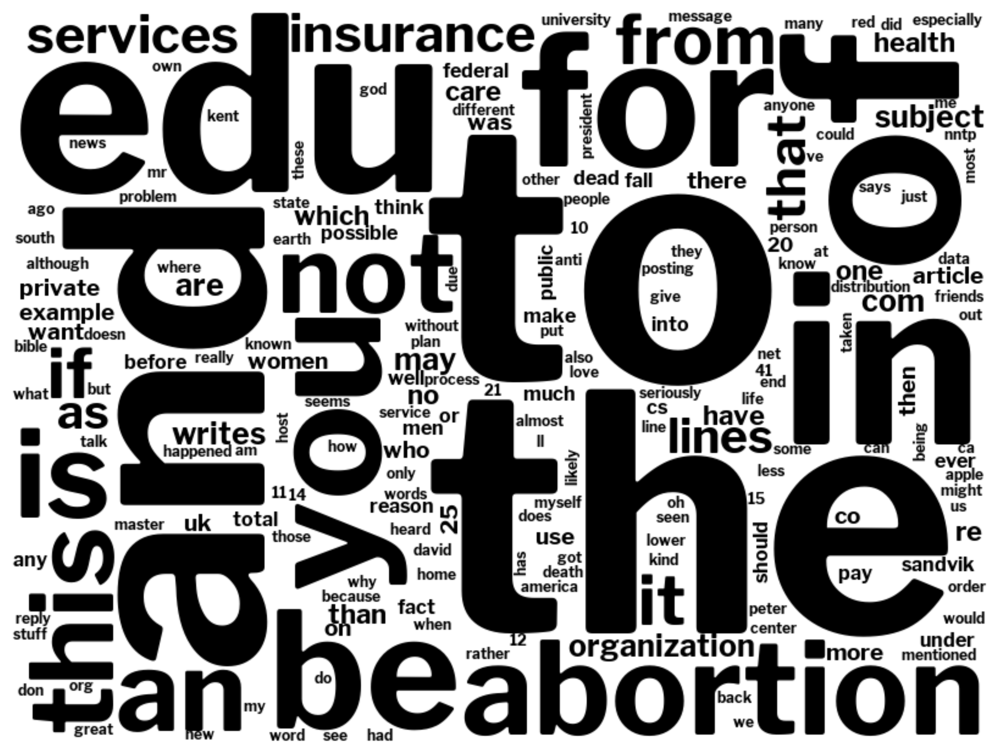

0	talk.religion.misc	Subject: Re: "Imaginary" Friends - Info and Experiences From: patb@bnr.co.uk (Pa...
63	talk.religion.misc	Organization: Penn State University From: <DGS4@psuvm.psu.edu> Subject: Re: ABOR...
102	talk.religion.misc	From: cj@eno.esd.sgi.com (C.J. Silverio) Subject: Re: ABORTION and private healt...
103	talk.religion.misc	From: royc@rbdc.wsnc.org (Roy Crabtree) Subject: Re: A Message for you Mr. Presi...
159	talk.religion.misc	From: dmcgee@uluhe.soest.hawaii.edu (Don McGee) Subject: Federal Hearing Origina...

talk.religion.misc Correctly classified


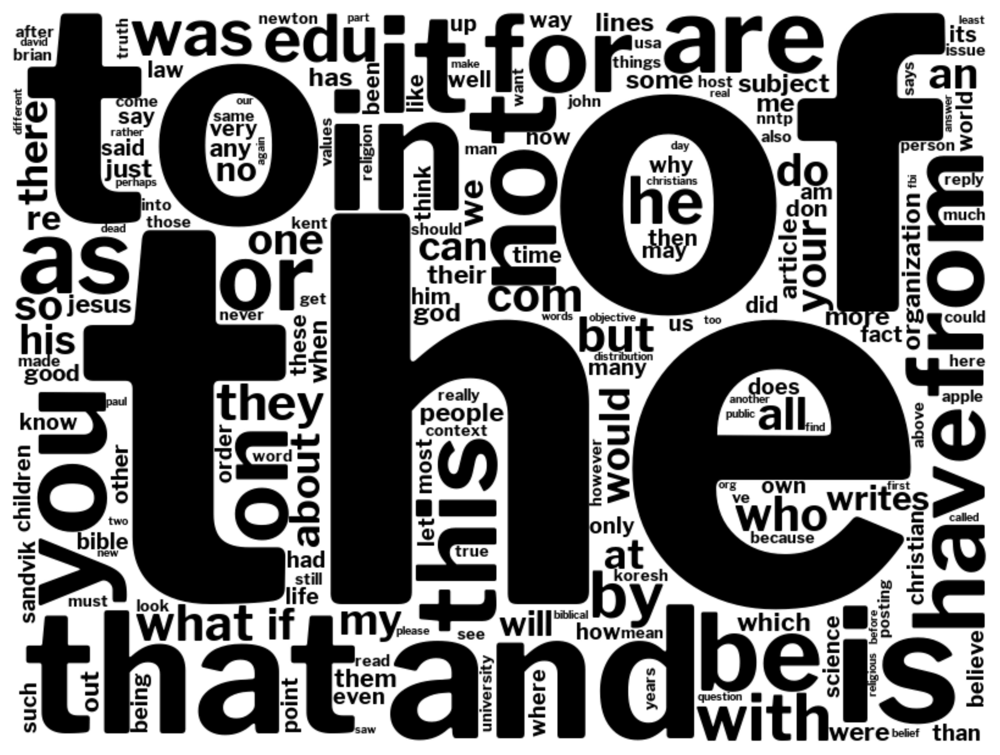

2	talk.religion.misc	From: kde@boi.hp.com (Keith Emmen) Subject: Re: A Message for you Mr. President:...
3	talk.religion.misc	From: clavazzi@nyx.cs.du.edu (The_Doge) Subject: What we can learn from the Waco...
6	talk.religion.misc	From: king@ctron.com (John E. King) Subject: Re: After 2000 years, can we say th...
7	talk.religion.misc	From: rh@smds.com (Richard Harter) Subject: Re: Rawlins debunks creationism Repl...
13	talk.religion.misc	From: ekr@kyle.eitech.com (Eric Rescorla) Subject: Re: After 2000 years, can we ...
14	talk.religion.misc	From: Thyagi@cup.portal.com (Thyagi Morgoth NagaSiva) Subject: ZOROASTRIANISM - ...
15	talk.religion.misc	From: merlyn@digibd.digibd.com (Merlyn LeRoy) Subject: Re: 14 Apr 93 God's Promi...
20	talk.religion.misc	From: caldwell@facman.ohsu.edu (Larry Caldwell) Subject: Re: Merlin, Mithras and...
21	talk.religion.misc	From: ch981@cleveland.Freenet.Edu (Tony Alicea) Subject: Re: Rosicrucian Order(s...
22	talk.religion.misc	From: nyikos@math.scarolina.

In [31]:
# setup a counter for each cell in the confusion matrix
counter = {}
previews = {}
for true_target, target_name in enumerate(dataset.target_names):
    counter[true_target] = {}
    previews[true_target] = {}
    for predicted_target, target_name in enumerate(dataset.target_names):
        counter[true_target][predicted_target] = {}
        previews[true_target][predicted_target] = ''

# get doc-term matrix for test docs
doc_terms = vect.transform(docs_test)

# iterate through all predictions, building the counter and preview of docs
# there is a better way to do this, but this will do!
for doc_id, prediction in enumerate(clf.predict(doc_terms)):
    for k, v in enumerate(doc_terms[doc_id].toarray()[0]):
        if v > 0:
            if lookup[k] not in counter[y_test[doc_id]][prediction]:
                counter[y_test[doc_id]][prediction][lookup[k]] = 0
            counter[y_test[doc_id]][prediction][lookup[k]] += v
    
    previews[y_test[doc_id]][prediction] += get_preview(docs_test, y_test, dataset.target_names, doc_id, max_len=80) + '\n'

# output a wordcloud and preview of docs for each cell of confusion matrix ...
for true_target, target_name in enumerate(dataset.target_names):
    for predicted_target, target_name in enumerate(dataset.target_names):
        if true_target == predicted_target:
            print(dataset.target_names[true_target],'Correctly classified')
        else:
            print(dataset.target_names[true_target],'incorrectly classified as',dataset.target_names[predicted_target])
        print('=================================================================')

        wordcloud = WordCloud(font_path='LibreFranklin-Bold.ttf',background_color="white", width=800, height=600, color_func=lambda *args, **kwargs: "black").generate_from_frequencies(counter[true_target][predicted_target])
        plt.figure(figsize=(16, 8), dpi= 600)
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()        
        
        print(previews[true_target][predicted_target])



## Preview document and its features

Use this cell to preview a document using its index in the test set. We can see the predicted label, its actual label, the full text and the features for this specific document.

In [30]:
test_id = 1

print('Prediction')
print('==========')
print(dataset.target_names[clf.predict(vect.transform([docs_test[test_id]]))[0]])
print()

print(get_preview(docs_test, y_test, dataset.target_names, test_id))

print('Features')
print('========')
for k, v in enumerate(vect.transform([docs_test[test_id]]).toarray()[0]):
    if v > 0:
        print(v, '\t', lookup[k])

Prediction
talk.religion.misc

Label
=====
talk.politics.misc

Full Text
From: bob1@cos.com (Bob Blackshaw)
Subject: Re: I thought commercial Advertising was Not allowed
Organization: Corporation for Open Systems
Distribution: na
Lines: 47

In <C50sJG.3Eu@voder.nsc.com> matt@galaxy.nsc.com (Matt Freivald x8043) writes:

>In article 164633 in talk.politics.misc, bob1@cos.com (Bob Blackshaw) writes:

>>>>And Ms. Regard, please don't give us the trite "you can't legislate 
>>>>morality" nonsense again: there is little else that is legislated, 
>>>>including the moral concept of "rights".

>>Really? Pure Socialism had this belief, and fell flat on its ass by
>>attempting to follow such reasoning. Suppose you pass a law that
>>states that I must love my neighbour, regardless of race, religion,
>>etc. How exactly do you plan to enforce such a law? Better yet, how
>>do you plan to measure compliance? And even if you overcome those
>>two obstacles, how will you ever know if I have become *more